In [1]:
import os
import cv2
import numpy as np
import pandas as pd
import tensorflow as tf
import pytesseract as pt
import plotly.express as px
import matplotlib.pyplot as plt
import xml.etree.ElementTree as xet

from glob import glob
from skimage import io
from shutil import copy
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import TensorBoard
from sklearn.model_selection import train_test_split
from tensorflow.keras.applications import InceptionResNetV2
from tensorflow.keras.layers import Dense, Dropout, Flatten, Input
from tensorflow.keras.preprocessing.image import load_img, img_to_array


In [6]:
path = glob('/Users/kartikrathi/Documents/ANPR_Project/Images/annotations/*.xml')
labels_dict = dict(filepath=[],xmin=[],xmax=[],ymin=[],ymax=[])
for filename in path:

    info = xet.parse(filename)
    root = info.getroot()
    member_object = root.find('object')
    labels_info = member_object.find('bndbox')
    xmin = int(labels_info.find('xmin').text)
    xmax = int(labels_info.find('xmax').text)
    ymin = int(labels_info.find('ymin').text)
    ymax = int(labels_info.find('ymax').text)

    labels_dict['filepath'].append(filename)
    labels_dict['xmin'].append(xmin)
    labels_dict['xmax'].append(xmax)
    labels_dict['ymin'].append(ymin)
    labels_dict['ymax'].append(ymax)

In the above code, we individually take each file and parse into xml.etree and find the object -> bndbox. Then we extract xmin,xmax,ymin,ymax and saved those values in the dictionary. After we convert it into a pandas data frame and save that into CSV file and save it in project folder as shown below.

In [7]:
df = pd.DataFrame(labels_dict)
df.to_csv('labels.csv',index=False)
df.head()

,filepath,xmin,xmax,ymin,ymax
0,/Users/kartikrathi/Documents/ANPR_Project/Imag...,150,233,160,194
1,/Users/kartikrathi/Documents/ANPR_Project/Imag...,254,372,229,264
2,/Users/kartikrathi/Documents/ANPR_Project/Imag...,6,48,143,161
3,/Users/kartikrathi/Documents/ANPR_Project/Imag...,146,260,187,213
4,/Users/kartikrathi/Documents/ANPR_Project/Imag...,209,293,217,254


With the above code, we successfully extract the diagonal position of each image and convert the data from an unstructured to a structured format.You can have A look data above. Now also extract the respective image filename of the XML.

In [9]:
filename = df['filepath'][0]
def getFilename(filename):
    filename_image = xet.parse(filename).getroot().find('filename').text
    filepath_image = os.path.join('/Users/kartikrathi/Documents/ANPR_Project/Images/images',filename_image)
    return filepath_image
getFilename(filename)

'/Users/kartikrathi/Documents/ANPR_Project/Images/images/Cars213.png'

In [10]:
image_path = list(df['filepath'].apply(getFilename))
image_path[:10]#random check

['/Users/kartikrathi/Documents/ANPR_Project/Images/images/Cars213.png',
 '/Users/kartikrathi/Documents/ANPR_Project/Images/images/Cars207.png',
 '/Users/kartikrathi/Documents/ANPR_Project/Images/images/Cars47.png',
 '/Users/kartikrathi/Documents/ANPR_Project/Images/images/Cars53.png',
 '/Users/kartikrathi/Documents/ANPR_Project/Images/images/Cars165.png',
 '/Users/kartikrathi/Documents/ANPR_Project/Images/images/Cars171.png',
 '/Users/kartikrathi/Documents/ANPR_Project/Images/images/Cars159.png',
 '/Users/kartikrathi/Documents/ANPR_Project/Images/images/Cars84.png',
 '/Users/kartikrathi/Documents/ANPR_Project/Images/images/Cars90.png',
 '/Users/kartikrathi/Documents/ANPR_Project/Images/images/Cars91.png']

<p id="part10"></p>

# <span style="font-family: Arials; font-size: 16px; font-style: normal; font-weight: bold; letter-spacing: 3px; text-align: center; color: #000000; line-height:1.0">VERIFY THE DATA</span>

As till now we did the manual process it is important to verify the information is we got is valid or not. For that just verify the bounding box is appearing properly for a given image. Here I consider the image N2.jpeg and the corresponding diagonal position can found in df. Result you can see on *Figure 8*


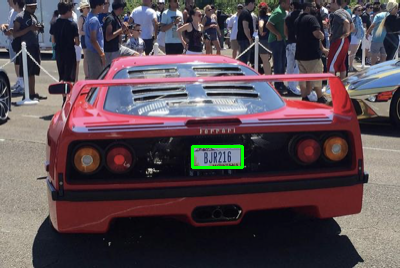

In [11]:
import cv2
import pandas as pd
from skimage import io
import plotly.express as px

# Assuming you have a DataFrame with bounding box coordinates
# Example DataFrame structure: df = pd.DataFrame({'xmin': [1804], 'ymin': [1734], 'xmax': [2493], 'ymax': [1882]})

file_path = image_path[5]  # path of image 
img = cv2.imread(file_path)  # read the image using OpenCV

# Fetch bounding box coordinates from the DataFrame
xmin, ymin, xmax, ymax = df['xmin'].iloc[5], df['ymin'].iloc[5], df['xmax'].iloc[5], df['ymax'].iloc[5]

# Draw a rectangle on the image
cv2.rectangle(img, (xmin, ymin), (xmax, ymax), (0, 255, 0), 2)  # BGR color format, (0, 255, 0) is green, 2 is the thickness

# Visualize the image using Plotly
fig = px.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
fig.update_layout(width=600, height=500, margin=dict(l=10, r=10, b=10, t=10), xaxis_title='Image with Bounding Box')

# Show the plot
fig.show()


<p id="part11"></p>

# <span style="font-family: Arials; font-size: 20px; font-style: normal; font-weight: bold; letter-spacing: 3px; text-align: center; color: #000000; line-height:1.0">3. DATA PROCESSING</span>

<p id="part12"></p>

# <span style="font-family: Arials; font-size: 16px; font-style: normal; font-weight: bold; letter-spacing: 3px; text-align: center; color: #000000; line-height:1.0">3.1 READ DATA</span>

This is a very important step, in this process we will take each and every image and convert it into an array using OpenCV and resize the image into 224 x 224 which is the standard compatible size of the pre-trained transfer learning model.

In [12]:
for image in image_path:
    print(image)
    try:
        img_arr = cv2.imread(image)
        if img_arr is None:
            print(f"Error reading image: {image}")
            continue  # Skip to the next iteration
    except Exception as e:
        print(f"Error reading image: {e}")
        continue  # Skip to the next iteration

    # Rest of your processing for the current image


/Users/kartikrathi/Documents/ANPR_Project/Images/images/Cars213.png
/Users/kartikrathi/Documents/ANPR_Project/Images/images/Cars207.png
/Users/kartikrathi/Documents/ANPR_Project/Images/images/Cars47.png
/Users/kartikrathi/Documents/ANPR_Project/Images/images/Cars53.png
/Users/kartikrathi/Documents/ANPR_Project/Images/images/Cars165.png
/Users/kartikrathi/Documents/ANPR_Project/Images/images/Cars171.png
/Users/kartikrathi/Documents/ANPR_Project/Images/images/Cars159.png
/Users/kartikrathi/Documents/ANPR_Project/Images/images/Cars84.png
/Users/kartikrathi/Documents/ANPR_Project/Images/images/Cars90.png
/Users/kartikrathi/Documents/ANPR_Project/Images/images/Cars91.png
/Users/kartikrathi/Documents/ANPR_Project/Images/images/Cars85.png
/Users/kartikrathi/Documents/ANPR_Project/Images/images/Cars158.png
/Users/kartikrathi/Documents/ANPR_Project/Images/images/Cars170.png
/Users/kartikrathi/Documents/ANPR_Project/Images/images/Cars164.png
/Users/kartikrathi/Documents/ANPR_Project/Images/image

/Users/kartikrathi/Documents/ANPR_Project/Images/images/Cars5.png
/Users/kartikrathi/Documents/ANPR_Project/Images/images/Cars4.png
/Users/kartikrathi/Documents/ANPR_Project/Images/images/Cars101.png
/Users/kartikrathi/Documents/ANPR_Project/Images/images/Cars115.png
/Users/kartikrathi/Documents/ANPR_Project/Images/images/Cars129.png
/Users/kartikrathi/Documents/ANPR_Project/Images/images/Cars23.png
/Users/kartikrathi/Documents/ANPR_Project/Images/images/Cars37.png
/Users/kartikrathi/Documents/ANPR_Project/Images/images/Cars303.png
/Users/kartikrathi/Documents/ANPR_Project/Images/images/Cars317.png
/Users/kartikrathi/Documents/ANPR_Project/Images/images/Cars277.png
/Users/kartikrathi/Documents/ANPR_Project/Images/images/Cars263.png
/Users/kartikrathi/Documents/ANPR_Project/Images/images/Cars288.png
/Users/kartikrathi/Documents/ANPR_Project/Images/images/Cars249.png
/Users/kartikrathi/Documents/ANPR_Project/Images/images/Cars275.png
/Users/kartikrathi/Documents/ANPR_Project/Images/image

/Users/kartikrathi/Documents/ANPR_Project/Images/images/Cars145.png
/Users/kartikrathi/Documents/ANPR_Project/Images/images/Cars73.png
/Users/kartikrathi/Documents/ANPR_Project/Images/images/Cars67.png
/Users/kartikrathi/Documents/ANPR_Project/Images/images/Cars192.png
/Users/kartikrathi/Documents/ANPR_Project/Images/images/Cars186.png
/Users/kartikrathi/Documents/ANPR_Project/Images/images/Cars227.png
/Users/kartikrathi/Documents/ANPR_Project/Images/images/Cars233.png
/Users/kartikrathi/Documents/ANPR_Project/Images/images/Cars225.png
/Users/kartikrathi/Documents/ANPR_Project/Images/images/Cars231.png
/Users/kartikrathi/Documents/ANPR_Project/Images/images/Cars219.png
/Users/kartikrathi/Documents/ANPR_Project/Images/images/Cars190.png
/Users/kartikrathi/Documents/ANPR_Project/Images/images/Cars184.png
/Users/kartikrathi/Documents/ANPR_Project/Images/images/Cars59.png
/Users/kartikrathi/Documents/ANPR_Project/Images/images/Cars71.png
/Users/kartikrathi/Documents/ANPR_Project/Images/ima

In [13]:
#Targeting all our values in array selecting all columns
labels = df.iloc[:,1:].values
data = []
output = []
for ind in range(len(image_path)):
    image = image_path[ind]
    img_arr = cv2.imread(image)
    h,w,d = img_arr.shape
    # Prepprocesing
    load_image = load_img(image,target_size=(224,224))
    load_image_arr = img_to_array(load_image)
    norm_load_image_arr = load_image_arr/255.0 # Normalization
    # Normalization to labels
    xmin,xmax,ymin,ymax = labels[ind]
    nxmin,nxmax = xmin/w,xmax/w
    nymin,nymax = ymin/h,ymax/h
    label_norm = (nxmin,nxmax,nymin,nymax) # Normalized output
    # Append
    data.append(norm_load_image_arr)
    output.append(label_norm)



# <span style="font-family: Arials; font-size: 16px; font-style: normal; font-weight: bold; letter-spacing: 3px; text-align: center; color: #000000; line-height:1.0">3.2 SPLIT TRAIN AND TEST SET</span>
In the next step, we will convert the list into an array using __Numpy__.

In [14]:
# Convert data to array
X = np.array(data,dtype=np.float32)
y = np.array(output,dtype=np.float32)

In [15]:
# Split the data into training and testing set using sklearn.
x_train,x_test,y_train,y_test = train_test_split(X,y,train_size=0.8,random_state=0)
x_train.shape,x_test.shape,y_train.shape,y_test.shape

((267, 224, 224, 3), (67, 224, 224, 3), (267, 4), (67, 4))

## resnet v2

In [35]:
inception_resnet = InceptionResNetV2(weights="imagenet",include_top=False, input_tensor=Input(shape=(224,224,3)))
# ---------------------
headmodel = inception_resnet.output
headmodel = Flatten()(headmodel)
headmodel = Dense(500,activation="relu")(headmodel)
headmodel = Dense(250,activation="relu")(headmodel)
headmodel = Dense(4,activation='sigmoid')(headmodel)


# ---------- model
model = Model(inputs=inception_resnet.input,outputs=headmodel)

2023-12-13 20:27:39.628541: I metal_plugin/src/device/metal_device.cc:1154] Metal device set to: Apple M2
2023-12-13 20:27:39.628663: I metal_plugin/src/device/metal_device.cc:296] systemMemory: 8.00 GB
2023-12-13 20:27:39.628675: I metal_plugin/src/device/metal_device.cc:313] maxCacheSize: 2.67 GB
2023-12-13 20:27:39.629375: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:306] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2023-12-13 20:27:39.629870: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:272] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)


Now compile the model and  have a look at our summary. Don't de surprise summary will be a bit massiv. The summary is textual and includes information about: The layers and their order in the model. The output shape of each layer. The number of parameters (weights) in each layer.

In [36]:
# Complie model
model.compile(loss='mse',optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4))
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, 111, 111, 32)         864       ['input_1[0][0]']             
                                                                                                  
 batch_normalization (Batch  (None, 111, 111, 32)         96        ['conv2d[0][0]']              
 Normalization)                                                                                   
                                                                                                  
 activation (Activation)     (None, 111, 111, 32)         0         ['batch_normalization[0][0

 conv2d_11 (Conv2D)          (None, 25, 25, 64)           12288     ['average_pooling2d[0][0]']   
                                                                                                  
 batch_normalization_5 (Bat  (None, 25, 25, 96)           288       ['conv2d_5[0][0]']            
 chNormalization)                                                                                 
                                                                                                  
 batch_normalization_7 (Bat  (None, 25, 25, 64)           192       ['conv2d_7[0][0]']            
 chNormalization)                                                                                 
                                                                                                  
 batch_normalization_10 (Ba  (None, 25, 25, 96)           288       ['conv2d_10[0][0]']           
 tchNormalization)                                                                                
          

 block35_1_conv (Conv2D)     (None, 25, 25, 320)          41280     ['block35_1_mixed[0][0]']     
                                                                                                  
 custom_scale_layer (Custom  (None, 25, 25, 320)          0         ['mixed_5b[0][0]',            
 ScaleLayer)                                                         'block35_1_conv[0][0]']      
                                                                                                  
 block35_1_ac (Activation)   (None, 25, 25, 320)          0         ['custom_scale_layer[0][0]']  
                                                                                                  
 conv2d_21 (Conv2D)          (None, 25, 25, 32)           10240     ['block35_1_ac[0][0]']        
                                                                                                  
 batch_normalization_21 (Ba  (None, 25, 25, 32)           96        ['conv2d_21[0][0]']           
 tchNormal

                                                                                                  
 activation_25 (Activation)  (None, 25, 25, 32)           0         ['batch_normalization_25[0][0]
                                                                    ']                            
                                                                                                  
 activation_28 (Activation)  (None, 25, 25, 48)           0         ['batch_normalization_28[0][0]
                                                                    ']                            
                                                                                                  
 conv2d_24 (Conv2D)          (None, 25, 25, 32)           10240     ['block35_2_ac[0][0]']        
                                                                                                  
 conv2d_26 (Conv2D)          (None, 25, 25, 32)           9216      ['activation_25[0][0]']       
          

                                                                                                  
 activation_32 (Activation)  (None, 25, 25, 32)           0         ['batch_normalization_32[0][0]
                                                                    ']                            
                                                                                                  
 activation_35 (Activation)  (None, 25, 25, 64)           0         ['batch_normalization_35[0][0]
                                                                    ']                            
                                                                                                  
 block35_4_mixed (Concatena  (None, 25, 25, 128)          0         ['activation_30[0][0]',       
 te)                                                                 'activation_32[0][0]',       
                                                                     'activation_35[0][0]']       
          

                                                                    ']                            
                                                                                                  
 conv2d_43 (Conv2D)          (None, 25, 25, 32)           10240     ['block35_5_ac[0][0]']        
                                                                                                  
 conv2d_46 (Conv2D)          (None, 25, 25, 48)           13824     ['activation_45[0][0]']       
                                                                                                  
 batch_normalization_43 (Ba  (None, 25, 25, 32)           96        ['conv2d_43[0][0]']           
 tchNormalization)                                                                                
                                                                                                  
 batch_normalization_46 (Ba  (None, 25, 25, 48)           144       ['conv2d_46[0][0]']           
 tchNormal

 batch_normalization_48 (Ba  (None, 25, 25, 32)           96        ['conv2d_48[0][0]']           
 tchNormalization)                                                                                
                                                                                                  
 batch_normalization_50 (Ba  (None, 25, 25, 32)           96        ['conv2d_50[0][0]']           
 tchNormalization)                                                                                
                                                                                                  
 batch_normalization_53 (Ba  (None, 25, 25, 64)           192       ['conv2d_53[0][0]']           
 tchNormalization)                                                                                
                                                                                                  
 activation_48 (Activation)  (None, 25, 25, 32)           0         ['batch_normalization_48[0][0]
          

 custom_scale_layer_7 (Cust  (None, 25, 25, 320)          0         ['block35_7_ac[0][0]',        
 omScaleLayer)                                                       'block35_8_conv[0][0]']      
                                                                                                  
 block35_8_ac (Activation)   (None, 25, 25, 320)          0         ['custom_scale_layer_7[0][0]']
                                                                                                  
 conv2d_63 (Conv2D)          (None, 25, 25, 32)           10240     ['block35_8_ac[0][0]']        
                                                                                                  
 batch_normalization_63 (Ba  (None, 25, 25, 32)           96        ['conv2d_63[0][0]']           
 tchNormalization)                                                                                
                                                                                                  
 activatio

                                                                    ']                            
                                                                                                  
 activation_70 (Activation)  (None, 25, 25, 48)           0         ['batch_normalization_70[0][0]
                                                                    ']                            
                                                                                                  
 conv2d_66 (Conv2D)          (None, 25, 25, 32)           10240     ['block35_9_ac[0][0]']        
                                                                                                  
 conv2d_68 (Conv2D)          (None, 25, 25, 32)           9216      ['activation_67[0][0]']       
                                                                                                  
 conv2d_71 (Conv2D)          (None, 25, 25, 64)           27648     ['activation_70[0][0]']       
          

                                                                                                  
 activation_77 (Activation)  (None, 12, 12, 128)          0         ['batch_normalization_77[0][0]
                                                                    ']                            
                                                                                                  
 conv2d_78 (Conv2D)          (None, 12, 12, 160)          143360    ['activation_77[0][0]']       
                                                                                                  
 batch_normalization_78 (Ba  (None, 12, 12, 160)          480       ['conv2d_78[0][0]']           
 tchNormalization)                                                                                
                                                                                                  
 activation_78 (Activation)  (None, 12, 12, 160)          0         ['batch_normalization_78[0][0]
          

                                                                                                  
 batch_normalization_85 (Ba  (None, 12, 12, 128)          384       ['conv2d_85[0][0]']           
 tchNormalization)                                                                                
                                                                                                  
 activation_85 (Activation)  (None, 12, 12, 128)          0         ['batch_normalization_85[0][0]
                                                                    ']                            
                                                                                                  
 conv2d_86 (Conv2D)          (None, 12, 12, 160)          143360    ['activation_85[0][0]']       
                                                                                                  
 batch_normalization_86 (Ba  (None, 12, 12, 160)          480       ['conv2d_86[0][0]']           
 tchNormal

                                                                    ]                             
                                                                                                  
 conv2d_93 (Conv2D)          (None, 12, 12, 128)          139264    ['block17_4_ac[0][0]']        
                                                                                                  
 batch_normalization_93 (Ba  (None, 12, 12, 128)          384       ['conv2d_93[0][0]']           
 tchNormalization)                                                                                
                                                                                                  
 activation_93 (Activation)  (None, 12, 12, 128)          0         ['batch_normalization_93[0][0]
                                                                    ']                            
                                                                                                  
 conv2d_94

 tomScaleLayer)                                                      'block17_6_conv[0][0]']      
                                                                                                  
 block17_6_ac (Activation)   (None, 12, 12, 1088)         0         ['custom_scale_layer_15[0][0]'
                                                                    ]                             
                                                                                                  
 conv2d_101 (Conv2D)         (None, 12, 12, 128)          139264    ['block17_6_ac[0][0]']        
                                                                                                  
 batch_normalization_101 (B  (None, 12, 12, 128)          384       ['conv2d_101[0][0]']          
 atchNormalization)                                                                               
                                                                                                  
 activatio

 block17_8_conv (Conv2D)     (None, 12, 12, 1088)         418880    ['block17_8_mixed[0][0]']     
                                                                                                  
 custom_scale_layer_17 (Cus  (None, 12, 12, 1088)         0         ['block17_7_ac[0][0]',        
 tomScaleLayer)                                                      'block17_8_conv[0][0]']      
                                                                                                  
 block17_8_ac (Activation)   (None, 12, 12, 1088)         0         ['custom_scale_layer_17[0][0]'
                                                                    ]                             
                                                                                                  
 conv2d_109 (Conv2D)         (None, 12, 12, 128)          139264    ['block17_8_ac[0][0]']        
                                                                                                  
 batch_nor

 block17_10_mixed (Concaten  (None, 12, 12, 384)          0         ['activation_112[0][0]',      
 ate)                                                                'activation_115[0][0]']      
                                                                                                  
 block17_10_conv (Conv2D)    (None, 12, 12, 1088)         418880    ['block17_10_mixed[0][0]']    
                                                                                                  
 custom_scale_layer_19 (Cus  (None, 12, 12, 1088)         0         ['block17_9_ac[0][0]',        
 tomScaleLayer)                                                      'block17_10_conv[0][0]']     
                                                                                                  
 block17_10_ac (Activation)  (None, 12, 12, 1088)         0         ['custom_scale_layer_19[0][0]'
                                                                    ]                             
          

 activation_123 (Activation  (None, 12, 12, 192)          0         ['batch_normalization_123[0][0
 )                                                                  ]']                           
                                                                                                  
 block17_12_mixed (Concaten  (None, 12, 12, 384)          0         ['activation_120[0][0]',      
 ate)                                                                'activation_123[0][0]']      
                                                                                                  
 block17_12_conv (Conv2D)    (None, 12, 12, 1088)         418880    ['block17_12_mixed[0][0]']    
                                                                                                  
 custom_scale_layer_21 (Cus  (None, 12, 12, 1088)         0         ['block17_11_ac[0][0]',       
 tomScaleLayer)                                                      'block17_12_conv[0][0]']     
          

 activation_128 (Activation  (None, 12, 12, 192)          0         ['batch_normalization_128[0][0
 )                                                                  ]']                           
                                                                                                  
 activation_131 (Activation  (None, 12, 12, 192)          0         ['batch_normalization_131[0][0
 )                                                                  ]']                           
                                                                                                  
 block17_14_mixed (Concaten  (None, 12, 12, 384)          0         ['activation_128[0][0]',      
 ate)                                                                'activation_131[0][0]']      
                                                                                                  
 block17_14_conv (Conv2D)    (None, 12, 12, 1088)         418880    ['block17_14_mixed[0][0]']    
          

 batch_normalization_139 (B  (None, 12, 12, 192)          576       ['conv2d_139[0][0]']          
 atchNormalization)                                                                               
                                                                                                  
 activation_136 (Activation  (None, 12, 12, 192)          0         ['batch_normalization_136[0][0
 )                                                                  ]']                           
                                                                                                  
 activation_139 (Activation  (None, 12, 12, 192)          0         ['batch_normalization_139[0][0
 )                                                                  ]']                           
                                                                                                  
 block17_16_mixed (Concaten  (None, 12, 12, 384)          0         ['activation_136[0][0]',      
 ate)     

 batch_normalization_144 (B  (None, 12, 12, 192)          576       ['conv2d_144[0][0]']          
 atchNormalization)                                                                               
                                                                                                  
 batch_normalization_147 (B  (None, 12, 12, 192)          576       ['conv2d_147[0][0]']          
 atchNormalization)                                                                               
                                                                                                  
 activation_144 (Activation  (None, 12, 12, 192)          0         ['batch_normalization_144[0][0
 )                                                                  ]']                           
                                                                                                  
 activation_147 (Activation  (None, 12, 12, 192)          0         ['batch_normalization_147[0][0
 )        

                                                                                                  
 conv2d_155 (Conv2D)         (None, 12, 12, 192)          215040    ['activation_154[0][0]']      
                                                                                                  
 batch_normalization_152 (B  (None, 12, 12, 192)          576       ['conv2d_152[0][0]']          
 atchNormalization)                                                                               
                                                                                                  
 batch_normalization_155 (B  (None, 12, 12, 192)          576       ['conv2d_155[0][0]']          
 atchNormalization)                                                                               
                                                                                                  
 activation_152 (Activation  (None, 12, 12, 192)          0         ['batch_normalization_152[0][0
 )        

 g2D)                                                                                             
                                                                                                  
 mixed_7a (Concatenate)      (None, 5, 5, 2080)           0         ['activation_157[0][0]',      
                                                                     'activation_159[0][0]',      
                                                                     'activation_162[0][0]',      
                                                                     'max_pooling2d_3[0][0]']     
                                                                                                  
 conv2d_164 (Conv2D)         (None, 5, 5, 192)            399360    ['mixed_7a[0][0]']            
                                                                                                  
 batch_normalization_164 (B  (None, 5, 5, 192)            576       ['conv2d_164[0][0]']          
 atchNorma

 e)                                                                  'activation_170[0][0]']      
                                                                                                  
 block8_2_conv (Conv2D)      (None, 5, 5, 2080)           933920    ['block8_2_mixed[0][0]']      
                                                                                                  
 custom_scale_layer_31 (Cus  (None, 5, 5, 2080)           0         ['block8_1_ac[0][0]',         
 tomScaleLayer)                                                      'block8_2_conv[0][0]']       
                                                                                                  
 block8_2_ac (Activation)    (None, 5, 5, 2080)           0         ['custom_scale_layer_31[0][0]'
                                                                    ]                             
                                                                                                  
 conv2d_17

 )                                                                  ]']                           
                                                                                                  
 block8_4_mixed (Concatenat  (None, 5, 5, 448)            0         ['activation_175[0][0]',      
 e)                                                                  'activation_178[0][0]']      
                                                                                                  
 block8_4_conv (Conv2D)      (None, 5, 5, 2080)           933920    ['block8_4_mixed[0][0]']      
                                                                                                  
 custom_scale_layer_33 (Cus  (None, 5, 5, 2080)           0         ['block8_3_ac[0][0]',         
 tomScaleLayer)                                                      'block8_4_conv[0][0]']       
                                                                                                  
 block8_4_

 )                                                                  ]']                           
                                                                                                  
 activation_186 (Activation  (None, 5, 5, 256)            0         ['batch_normalization_186[0][0
 )                                                                  ]']                           
                                                                                                  
 block8_6_mixed (Concatenat  (None, 5, 5, 448)            0         ['activation_183[0][0]',      
 e)                                                                  'activation_186[0][0]']      
                                                                                                  
 block8_6_conv (Conv2D)      (None, 5, 5, 2080)           933920    ['block8_6_mixed[0][0]']      
                                                                                                  
 custom_sc

 atchNormalization)                                                                               
                                                                                                  
 activation_191 (Activation  (None, 5, 5, 192)            0         ['batch_normalization_191[0][0
 )                                                                  ]']                           
                                                                                                  
 activation_194 (Activation  (None, 5, 5, 256)            0         ['batch_normalization_194[0][0
 )                                                                  ]']                           
                                                                                                  
 block8_8_mixed (Concatenat  (None, 5, 5, 448)            0         ['activation_191[0][0]',      
 e)                                                                  'activation_194[0][0]']      
          

 atchNormalization)                                                                               
                                                                                                  
 batch_normalization_202 (B  (None, 5, 5, 256)            768       ['conv2d_202[0][0]']          
 atchNormalization)                                                                               
                                                                                                  
 activation_199 (Activation  (None, 5, 5, 192)            0         ['batch_normalization_199[0][0
 )                                                                  ]']                           
                                                                                                  
 activation_202 (Activation  (None, 5, 5, 256)            0         ['batch_normalization_202[0][0
 )                                                                  ]']                           
          

<p id="part16"></p>

# <span style="font-family: Arials; font-size: 16px; font-style: normal; font-weight: bold; letter-spacing: 3px; text-align: center; color: #000000; line-height:1.0">INCEPTION-RESNET-V2 TRAINING AND SAVE</span>

In [37]:
history = model.fit(x=x_train,y=y_train,batch_size=10,epochs=100,
                    validation_data=(x_test,y_test))

Epoch 1/100


2023-12-13 20:27:58.701784: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:117] Plugin optimizer for device_type GPU is enabled.
2023-12-13 20:28:00.243233: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] model_pruner failed: INVALID_ARGUMENT: Graph does not contain terminal node Adam/AssignAddVariableOp.


27/27 [==============================] - 58s 1s/step - loss: 0.1354 - val_loss: 0.1476
Epoch 2/100
27/27 [==============================] - 22s 783ms/step - loss: 0.1426 - val_loss: 0.1580
Epoch 3/100
27/27 [==============================] - 18s 675ms/step - loss: 0.1400 - val_loss: 0.1305
Epoch 4/100
27/27 [==============================] - 18s 676ms/step - loss: 0.1230 - val_loss: 0.1439
Epoch 5/100
27/27 [==============================] - 20s 756ms/step - loss: 0.0983 - val_loss: 0.0958
Epoch 6/100
27/27 [==============================] - 19s 687ms/step - loss: 0.0825 - val_loss: 0.0782
Epoch 7/100
27/27 [==============================] - 18s 646ms/step - loss: 0.0767 - val_loss: 0.0589
Epoch 8/100
27/27 [==============================] - 17s 633ms/step - loss: 0.0754 - val_loss: 0.0537
Epoch 9/100
27/27 [==============================] - 21s 787ms/step - loss: 0.0659 - val_loss: 0.0499
Epoch 10/100
27/27 [==============================] - 19s 717ms/step - loss: 0.0622 - val_loss: 0

Epoch 81/100
27/27 [==============================] - 15s 571ms/step - loss: 0.0198 - val_loss: 0.0236
Epoch 82/100
27/27 [==============================] - 24s 878ms/step - loss: 0.0194 - val_loss: 0.0161
Epoch 83/100
27/27 [==============================] - 16s 577ms/step - loss: 0.0160 - val_loss: 0.0262
Epoch 84/100
27/27 [==============================] - 16s 589ms/step - loss: 0.0166 - val_loss: 0.0225
Epoch 85/100
27/27 [==============================] - 16s 582ms/step - loss: 0.0159 - val_loss: 0.0223
Epoch 86/100
27/27 [==============================] - 16s 595ms/step - loss: 0.0135 - val_loss: 0.0219
Epoch 87/100
27/27 [==============================] - 16s 594ms/step - loss: 0.0180 - val_loss: 0.0189
Epoch 88/100
27/27 [==============================] - 15s 563ms/step - loss: 0.0147 - val_loss: 0.0236
Epoch 89/100
27/27 [==============================] - 15s 544ms/step - loss: 0.0150 - val_loss: 0.0263
Epoch 90/100
27/27 [==============================] - 15s 538ms/step - lo

In [38]:
model.save('/Users/kartikrathi/Documents/ANPR_Project/object_detection_resnet.h5')

/Users/kartikrathi/anaconda3/lib/python3.10/site-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.



In [40]:
# Load model
model = tf.keras.models.load_model('/Users/kartikrathi/Documents/ANPR_Project/object_detection_resnet.h5')
print('Model loaded Sucessfully')

Model loaded Sucessfully


Next is loading our TEST picture with right path to it. I loaded some more images for this purpose  only - folder __TEST__.

In [68]:
path = '/Users/kartikrathi/Documents/ANPR Project/test/img4.jpeg'
image = load_img(path) # PIL object
image = np.array(image,dtype=np.uint8) # 8 bit array (0,255)
image1 = load_img(path,target_size=(224,224))
image_arr_224 = img_to_array(image1)/255.0  # Convert into array and get the normalized output

# Size of the orginal image
h,w,d = image.shape
print('Height of the image =',h)
print('Width of the image =',w)


Height of the image = 183
Width of the image = 275


Now we can have a look at our image *Figure 13*


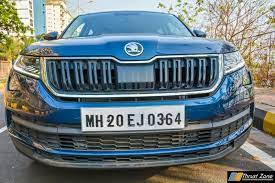

In [69]:
fig = px.imshow(image)
fig.update_layout(width=700, height=500,  margin=dict(l=10, r=10, b=10, t=10), xaxis_title='Figure 13 - TEST Image')

So, let's look into the shape of my image.

In [70]:
image_arr_224.shape

(224, 224, 3)

But in order to pass this image of a model, we need to provide the data in the dynamic fourth dimension. And what one indicates is a number of images. So here we are just passing only one image.

In [71]:
test_arr = image_arr_224.reshape(1,224,224,3)
test_arr.shape

(1, 224, 224, 3)

<p id="part20"></p>

# <span style="font-family: Arials; font-size: 16px; font-style: normal; font-weight: bold; letter-spacing: 3px; text-align: center; color: #000000; line-height:1.0">5.2 DE-NORMALIZE THE OUTPUT</span>

In [72]:
# Make predictions
coords = model.predict(test_arr)
coords

1/1 [==============================] - 0s 178ms/step


array([[0.30331096, 0.7905328 , 0.48399755, 0.6286995 ]], dtype=float32)

We have got the output from the model and output what we got is the normalized output. So, what we need to do is to convert back into our original form values, which actually we did in during the training process, in the training process, we have the original form values and convert that normalized one. So basically, we will de-normalize the values back.

In [73]:
# Denormalize the values
denorm = np.array([w,w,h,h])
coords = coords * denorm
coords

array([[ 83.41051415, 217.39652753,  88.57155231, 115.05200511]])

<p id="part21"></p>

# <span style="font-family: Arials; font-size: 16px; font-style: normal; font-weight: bold; letter-spacing: 3px; text-align: center; color: #000000; line-height:1.0">BOUNDING BOX</span>

Now we will draw bounding box on top of the image. I just want to provide the two diagonal points. Let's make use of these points and let's draw the rectangle box.

In [74]:
coords = coords.astype(np.int32)
coords

array([[ 83, 217,  88, 115]], dtype=int32)

In [75]:
# Draw bounding on top the image
xmin, xmax,ymin,ymax = coords[0]
pt1 =(xmin,ymin)
pt2 =(xmax,ymax)
print(pt1, pt2)

(83, 88) (217, 115)



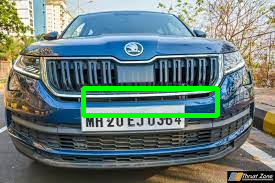

In [76]:
cv2.rectangle(image,pt1,pt2,(0,255,0),3)
fig = px.imshow(image)
fig.update_layout(width=700, height=500, margin=dict(l=10, r=10, b=10, t=10))

<p id="part22"></p>

# <span style="font-family: Arials; font-size: 16px; font-style: normal; font-weight: bold; letter-spacing: 3px; text-align: center; color: #000000; line-height:1.0">CREATE PIPELINE</span>

Now what we'll do, let's put it all together in one place and create function. And in the end visualize it. Our output will return image and coordinates of bounding box.

1/1 [==============================] - 0s 183ms/step
(72, 67) (330, 126)



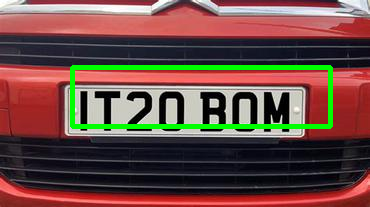

In [78]:
# Create pipeline
path = '/Users/kartikrathi/Documents/ANPR_Project/test/img.jpg'
def object_detection(path):
    
    # Read image
    image = load_img(path) # PIL object
    
    image = np.array(image,dtype=np.uint8) # 8 bit array (0,255)
    image1 = load_img(path,target_size=(224,224))
    
    # Data preprocessing
    image_arr_224 = img_to_array(image1)/255.0 # Convert to array & normalized
    h,w,d = image.shape
    test_arr = image_arr_224.reshape(1,224,224,3)
    
    # Make predictions
    coords = model.predict(test_arr)
    
    # Denormalize the values
    denorm = np.array([w,w,h,h])
    coords = coords * denorm
    coords = coords.astype(np.int32)
    
    # Draw bounding on top the image
    xmin, xmax,ymin,ymax = coords[0]
    pt1 =(xmin,ymin)
    pt2 =(xmax,ymax)
    print(pt1, pt2)
    cv2.rectangle(image,pt1,pt2,(0,255,0),3)
    return image, coords

image, cods = object_detection(path)

fig = px.imshow(image)
fig.update_layout(width=700, height=500, margin=dict(l=10, r=10, b=10, t=10),xaxis_title='Figure 14')

In [63]:
# parsing
def parsing(path):
    parser = xet.parse(path).getroot()
    name = parser.find('filename').text
    filename = f'/Users/kartikrathi/Documents/ANPR_Project/Images/images/{name}'

    # width and height
    parser_size = parser.find('size')
    width = int(parser_size.find('width').text)
    height = int(parser_size.find('height').text)
    
    return filename, width, height
df[['filename','width','height']] = df['filepath'].apply(parsing).apply(pd.Series)
df.head()

,filepath,xmin,xmax,ymin,ymax,filename,width,height,center_x,center_y,bb_width,bb_height
0,/Users/kartikrathi/Documents/ANPR_Project/Imag...,150,233,160,194,/Users/kartikrathi/Documents/ANPR_Project/Imag...,400,300,0.478750,0.590000,0.207500,0.113333
1,/Users/kartikrathi/Documents/ANPR_Project/Imag...,254,372,229,264,/Users/kartikrathi/Documents/ANPR_Project/Imag...,400,478,0.782500,0.515690,0.295000,0.073222
2,/Users/kartikrathi/Documents/ANPR_Project/Imag...,6,48,143,161,/Users/kartikrathi/Documents/ANPR_Project/Imag...,400,300,0.067500,0.506667,0.105000,0.060000
3,/Users/kartikrathi/Documents/ANPR_Project/Imag...,146,260,187,213,/Users/kartikrathi/Documents/ANPR_Project/Imag...,400,288,0.507500,0.694444,0.285000,0.090278
4,/Users/kartikrathi/Documents/ANPR_Project/Imag...,209,293,217,254,/Users/kartikrathi/Documents/ANPR_Project/Imag...,590,343,0.425424,0.686589,0.142373,0.107872


Now the next step is let me calculate the center_x, center_y, width and height, which is normalized to width and height. And as well normalize width and height of bounding box.

In [64]:
# center_x, center_y, width , height
df['center_x'] = (df['xmax'] + df['xmin'])/(2*df['width'])
df['center_y'] = (df['ymax'] + df['ymin'])/(2*df['height'])

df['bb_width'] = (df['xmax'] - df['xmin'])/df['width']
df['bb_height'] = (df['ymax'] - df['ymin'])/df['height']
df.head()

,filepath,xmin,xmax,ymin,ymax,filename,width,height,center_x,center_y,bb_width,bb_height
0,/Users/kartikrathi/Documents/ANPR_Project/Imag...,150,233,160,194,/Users/kartikrathi/Documents/ANPR_Project/Imag...,400,300,0.478750,0.590000,0.207500,0.113333
1,/Users/kartikrathi/Documents/ANPR_Project/Imag...,254,372,229,264,/Users/kartikrathi/Documents/ANPR_Project/Imag...,400,478,0.782500,0.515690,0.295000,0.073222
2,/Users/kartikrathi/Documents/ANPR_Project/Imag...,6,48,143,161,/Users/kartikrathi/Documents/ANPR_Project/Imag...,400,300,0.067500,0.506667,0.105000,0.060000
3,/Users/kartikrathi/Documents/ANPR_Project/Imag...,146,260,187,213,/Users/kartikrathi/Documents/ANPR_Project/Imag...,400,288,0.507500,0.694444,0.285000,0.090278
4,/Users/kartikrathi/Documents/ANPR_Project/Imag...,209,293,217,254,/Users/kartikrathi/Documents/ANPR_Project/Imag...,590,343,0.425424,0.686589,0.142373,0.107872


# YOLOV5

<p id="part35"></p>

# <span style="font-family: Arials; font-size: 16px; font-style: normal; font-weight: bold; letter-spacing: 3px; text-align: center; color: #000000; line-height:1.0">DATA PREPARATION</span>


In [65]:
!git clone https://github.com/ultralytics/yolov5

fatal: destination path 'yolov5' already exists and is not an empty directory.


In [66]:
!pip install -r ./yolov5/requirements.txt

We need to make a one more folder and make into it two more - name it as __data_images__ and __train__ and __test__. We will split data to train and split.

In [67]:
mkdir /Users/kartikrathi/Documents/ANPR_Project/yolov5/data_images/

mkdir: /Users/kartikrathi/Documents/ANPR_Project/yolov5/data_images/: File exists


In [68]:
mkdir /Users/kartikrathi/Documents/ANPR_Project/yolov5/data_images/test/

mkdir: /Users/kartikrathi/Documents/ANPR_Project/yolov5/data_images/test/: File exists


In [69]:
mkdir /Users/kartikrathi/Documents/ANPR_Project/yolov5/data_images/train/

mkdir: /Users/kartikrathi/Documents/ANPR_Project/yolov5/data_images/train/: File exists


In [70]:
### split the data into train and test
df_train = df.iloc[:200]
df_test = df.iloc[200:]

We will copy each image into the folder train and test and generate .txt which has label info.

In [73]:
train_folder = '/Users/kartikrathi/Documents/ANPR_Project/yolov5/data_images/train'

values = df_train[['filename','center_x','center_y','bb_width','bb_height']].values
for fname, x,y, w, h in values:
    image_name = os.path.split(fname)[-1]
    txt_name = os.path.splitext(image_name)[0]
    
    dst_image_path = os.path.join(train_folder,image_name)
    dst_label_file = os.path.join(train_folder,txt_name+'.txt')
    
    # copy each image into the folder
    copy(fname,dst_image_path)

    # generate .txt which has label info
    label_txt = f'0 {x} {y} {w} {h}'
    with open(dst_label_file,mode='w') as f:
        f.write(label_txt)
        
        f.close()

test_folder = '/Users/kartikrathi/Documents/ANPR_Project/yolov5/data_images/test'

values = df_test[['filename','center_x','center_y','bb_width','bb_height']].values
for fname, x,y, w, h in values:
    image_name = os.path.split(fname)[-1]
    txt_name = os.path.splitext(image_name)[0]
    
    dst_image_path = os.path.join(test_folder,image_name)
    dst_label_file = os.path.join(test_folder,txt_name+'.txt')
    
    # copy each image into the folder
    copy(fname,dst_image_path)

    # generate .txt which has label info
    label_txt = f'0 {x} {y} {w} {h}'
    with open(dst_label_file,mode='w') as f:
        f.write(label_txt)
        
        f.close()

In [75]:
!pip install GPUtil

import torch
from GPUtil import showUtilization as gpu_usage
from numba import cuda

def free_gpu_cache():
    print("Initial GPU Usage")
    gpu_usage()                             

    torch.cuda.empty_cache()

    cuda.select_device(0)
    cuda.close()
    cuda.select_device(0)

    print("GPU Usage after emptying the cache")
    gpu_usage()

free_gpu_cache()  

  Preparing metadata (setup.py) ... done
  Created wheel for GPUtil: filename=GPUtil-1.4.0-py3-none-any.whl size=7392 sha256=1182a48fa66a56f7f7835fea6102ef6e1e17dd62650945d5a0ded3510bf9388a
  Stored in directory: /Users/kartikrathi/Library/Caches/pip/wheels/3f/ba/79/c3f79af46e3805ff7b27425add0d96bcbcef5bbb69db47aa26
Successfully built GPUtil
Initial GPU Usage
| ID | GPU | MEM |
------------------


CudaSupportError: Error at driver init: 

CUDA driver library cannot be found.
If you are sure that a CUDA driver is installed,
try setting environment variable NUMBA_CUDA_DRIVER
with the file path of the CUDA driver shared library.
:

In [77]:
!python /Users/kartikrathi/Documents/ANPR_Project/yolov5/train.py --data /Users/kartikrathi/Documents/ANPR_Project/data.yaml --cfg /Users/kartikrathi/Documents/ANPR_Project/yolov5/models/yolov5s.yaml --batch-size 8 --name Model --epochs 100

train: weights=yolov5/yolov5s.pt, cfg=/Users/kartikrathi/Documents/ANPR_Project/yolov5/models/yolov5s.yaml, data=/Users/kartikrathi/Documents/ANPR_Project/data.yaml, hyp=yolov5/data/hyps/hyp.scratch-low.yaml, epochs=100, batch_size=8, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=yolov5/runs/train, name=Model, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
remote: Enumerating objects: 7, done.
remote: Counting objects: 100% (7/7), done.
remote: Compressing objects: 100% (5/5), done.
remote: Total 7 (delta 2), reused 6 (delta 2), pack-reused 0
Unpacking objects: 100% (7/7), 2.94 KiB | 301.00 KiB/s, done.
From https://github.com/ultral

       6/99         0G    0.05227    0.01601          0         10        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all        134        134      0.489      0.575      0.465      0.166

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
       7/99         0G    0.05082    0.01475          0         15        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all        134        134       0.52      0.642      0.604      0.277

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
       8/99         0G    0.05053    0.01301          0         10        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all        134        134      0.697      0.657      0.744      0.365

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
       9/9

      31/99         0G    0.03214   0.007741          0         16        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all        134        134      0.935      0.964       0.97      0.631

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
      32/99         0G    0.03147   0.007897          0         13        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all        134        134      0.946      0.978      0.967      0.608

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
      33/99         0G     0.0307   0.007929          0          9        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all        134        134      0.944      0.963       0.96      0.648

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
      34/9

      56/99         0G    0.02522   0.006909          0          9        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all        134        134       0.95      0.978      0.975      0.682

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
      57/99         0G    0.02482   0.006861          0          5        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all        134        134      0.949      0.993      0.984      0.697

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
      58/99         0G    0.02466   0.006793          0          8        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all        134        134      0.942      0.964      0.967      0.703

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
      59/9

      81/99         0G     0.0203   0.006039          0         12        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all        134        134      0.948      0.978      0.976       0.77

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
      82/99         0G    0.01935   0.005951          0         11        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all        134        134      0.957      0.991      0.985      0.773

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
      83/99         0G    0.02008   0.005938          0          7        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all        134        134      0.946      0.985      0.979      0.793

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
      84/9

In [78]:
!python /Users/kartikrathi/Documents/ANPR_Project/yolov5/export.py --weight /Users/kartikrathi/Documents/ANPR_Project/yolov5/runs/train/Model/weights/best.pt --include torchscript onnx --opset 11

export: data=yolov5/data/coco128.yaml, weights=['/Users/kartikrathi/Documents/ANPR_Project/yolov5/runs/train/Model/weights/best.pt'], imgsz=[640, 640], batch_size=1, device=cpu, half=False, inplace=False, keras=False, optimize=False, int8=False, dynamic=False, simplify=False, opset=11, verbose=False, workspace=4, nms=False, agnostic_nms=False, topk_per_class=100, topk_all=100, iou_thres=0.45, conf_thres=0.25, include=['torchscript', 'onnx']
YOLOv5 🚀 v7.0-247-g3f02fde Python-3.10.9 torch-2.1.1 CPU

Fusing layers... 
YOLOv5s summary: 157 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs

PyTorch: starting from /Users/kartikrathi/Documents/ANPR_Project/yolov5/runs/train/Model/weights/best.pt with output shape (1, 25200, 6) (13.7 MB)

TorchScript: starting export with torch 2.1.1...
TorchScript: export success ✅ 0.9s, saved as /Users/kartikrathi/Documents/ANPR_Project/yolov5/runs/train/Model/weights/best.torchscript (27.2 MB)
requirements: Ultralytics requirement ['onnx>=1.12.0'] not fo

In [79]:
#!python ./yolov5/export.py --weights ./yolov5/runs/train/Model/weights/best.pt --include torchscript onnx --dynamic --simplify --optimize --opset 10
!python ./yolov5/export.py --weight ./yolov5/runs/train/Model/weights/best.pt --include torchscript onnx --opset 11

export: data=yolov5/data/coco128.yaml, weights=['./yolov5/runs/train/Model/weights/best.pt'], imgsz=[640, 640], batch_size=1, device=cpu, half=False, inplace=False, keras=False, optimize=False, int8=False, dynamic=False, simplify=False, opset=11, verbose=False, workspace=4, nms=False, agnostic_nms=False, topk_per_class=100, topk_all=100, iou_thres=0.45, conf_thres=0.25, include=['torchscript', 'onnx']
YOLOv5 🚀 v7.0-247-g3f02fde Python-3.10.9 torch-2.1.1 CPU

Fusing layers... 
YOLOv5s summary: 157 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs

PyTorch: starting from yolov5/runs/train/Model/weights/best.pt with output shape (1, 25200, 6) (13.7 MB)

TorchScript: starting export with torch 2.1.1...
TorchScript: export success ✅ 0.8s, saved as yolov5/runs/train/Model/weights/best.torchscript (27.2 MB)

ONNX: starting export with onnx 1.15.0...
ONNX: export success ✅ 0.3s, saved as yolov5/runs/train/Model/weights/best.onnx (27.2 MB)

Export complete (1.4s)
Results saved to /Users/kart

In [2]:
import onnx

model_path = '/Users/kartikrathi/Documents/ANPR_Project/yolov5/runs/train/Model/weights/best.onnx'
model = onnx.load(model_path)

# Get the opset version
opset_version = model.opset_import[0].version if model.opset_import else None

print(f"The opset version of the model is: {opset_version}")

The opset version of the model is: 11


When model trained, we need to save our it in order to use it at OCR in onnx format as below:

In [3]:
# settings
INPUT_WIDTH =  640
INPUT_HEIGHT = 640

Let me first load TEST image, it will have a plate number on it.


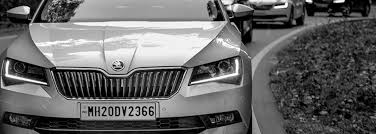

In [4]:
# LOAD THE IMAGE
img = io.imread('/Users/kartikrathi/Documents/ANPR_Project/test/images.jpeg')

fig = px.imshow(img)
fig.update_layout(width=700, height=400, margin=dict(l=10, r=10, b=10, t=10))
fig.update_xaxes(showticklabels=False).update_yaxes(showticklabels=False)
fig.show()

Now, we will load our YOLO model.

In [5]:
# LOAD YOLO MODEL
net = cv2.dnn.readNetFromONNX('/Users/kartikrathi/Documents/ANPR_Project/yolov5/runs/train/Model/weights/best.onnx')
net.setPreferableBackend(cv2.dnn.DNN_BACKEND_OPENCV)
net.setPreferableTarget(cv2.dnn.DNN_TARGET_CPU)

The next step is I need to parse this image to my YOLO model and get the prediction. Important - size we need to set as input width a 640 and input height is 640.

The first four columns will give you the information about the bounding box, which is center X and, Center Y, W and H. And these values are normalized to 640 by 640. And the next two values are the confidence and the probabilities. Confidence tells us what is the confidence for the detecting the bounding box and the next one is the probability score of the class, since we have only one class that is number plate.

Let’s make a list of boxes and confidence and place it order. As well we need to identify our X_factor and Y_factor of image.

We have to filter detections based on the confidence score and the probability score. Let me take the confidence >0.4 and filter from class >0.25.

There is will be one of major issue with YOLO modeling it will give you the repeated boxes, but the same object it might give you that multiple boxes. For that we need to perform the non-maximum suppression. To do it we need to provide all our clean boxes and confidences. 

In the end of that part of code I will take bounding boxes and draw the rectangle box to our image. And will write it all in functions. 

In [16]:
def get_detections(img,net):
    
    # 1.CONVERT IMAGE TO YOLO FORMAT
    image = img.copy()
    row, col, d = image.shape # extract row, column and channels of image

    max_rc = max(row,col) # cal max no. of rows and cols
    input_image = np.zeros((max_rc,max_rc,3),dtype=np.uint8)# is a square canvas initialized with zeros and dtype uint8.
    input_image[0:row,0:col] = image

    # 2. GET PREDICTION FROM YOLO MODEL
    blob = cv2.dnn.blobFromImage(input_image,1/255,(INPUT_WIDTH,INPUT_HEIGHT),swapRB=True,crop=False)#converts the input image into a 4D blob suitable for input to the YOLO model.
    net.setInput(blob)
    preds = net.forward()# performs a forward pass through the YOLO network, and preds contains the raw predictions.
    detections = preds[0] # extracts the predictions for the first (0th) image in the batch.
    
    return input_image, detections

def non_maximum_supression(input_image,detections):
    
    '''
    This function takes the preprocessed image (input_image) and the raw detections obtained from the YOLO model 
    (detections) and performs non-maximum suppression (NMS) to filter out redundant detections.
    '''
    
    # 3. FILTER DETECTIONS BASED ON CONFIDENCE AND PROBABILIY SCORE
    
    # center x, center y, w , h, conf, proba
    boxes = []
    confidences = []

    image_w, image_h = input_image.shape[:2]
    x_factor = image_w/INPUT_WIDTH #x_factor and y_factor are scaling factors to adjust bounding box coordinates based on the original image dimensions.
    y_factor = image_h/INPUT_HEIGHT

    
    #The confidence score indicates how sure the model is that the box contains an object and also how accurate it thinks the box is that predicts
    for i in range(len(detections)):
        row = detections[i]
        confidence = row[4] # confidence of detecting license plate
        if confidence > 0.4:
            class_score = row[5] # probability score of license plate
            if class_score > 0.25:
                cx, cy , w, h = row[0:4]

                left = int((cx - 0.5*w)*x_factor)
                top = int((cy-0.5*h)*y_factor)
                width = int(w*x_factor)
                height = int(h*y_factor)
                box = np.array([left,top,width,height])

                confidences.append(confidence)
                boxes.append(box)

    # CLEAN
    boxes_np = np.array(boxes).tolist()
    confidences_np = np.array(confidences).tolist()
    
    # NMS
    index = cv2.dnn.NMSBoxes(boxes_np,confidences_np,0.25,0.45)
    
    return boxes_np, confidences_np, index

def drawings(image,boxes_np,confidences_np,index):
    # Drawings
    for ind in index:
        x,y,w,h =  boxes_np[ind]
        bb_conf = confidences_np[ind]
        conf_text = 'plate: {:.0f}%'.format(bb_conf*100)
#         license_text = extract_text(image,boxes_np[ind])


        cv2.rectangle(image,(x,y),(x+w,y+h),(255,0,255),2)
        cv2.rectangle(image,(x,y-30),(x+w,y),(255,0,255),-1)
        cv2.rectangle(image,(x,y+h),(x+w,y+h+25),(0,0,0),-1)


        cv2.putText(image,conf_text,(x,y-10),cv2.FONT_HERSHEY_SIMPLEX,0.7,(255,255,255),1)
#         cv2.putText(image,license_text,(x,y+h+27),cv2.FONT_HERSHEY_SIMPLEX,0.7,(0,255,0),1)

    return image

In [17]:
# predictions flow with return result
def yolo_predictions(img,net):
    # step-1: detections
    input_image, detections = get_detections(img,net)
    # step-2: NMS
    boxes_np, confidences_np, index = non_maximum_supression(input_image, detections)
    # step-3: Drawings
    result_img = drawings(img,boxes_np,confidences_np,index)
    #
    return result_img

Bounding Box Coordinates: (97, 512, 112, 41)


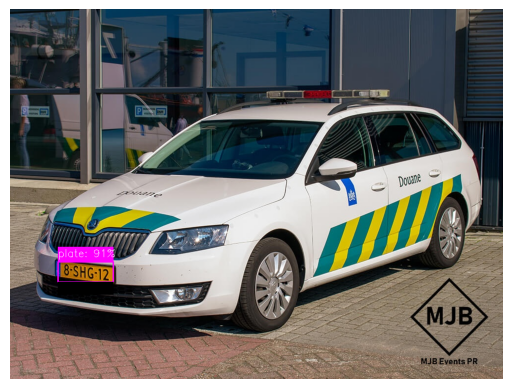

In [41]:
def yolo_predictions(img, net):
    # Step 1: Get detections
    input_image, detections = get_detections(img, net)
    
    # Step 2: Non-Maximum Suppression
    boxes_np, confidences_np, index = non_maximum_supression(input_image, detections)
    
    # Step 3: Drawings
    result_img = drawings(img, boxes_np, confidences_np, index)
    
    # Extract bounding box coordinates
    bounding_box_coords = [boxes_np[i] for i in index]
    
    return result_img, bounding_box_coords

# Test
img = io.imread('/Users/kartikrathi/Documents/ANPR_Project/test/Cars447.jpeg')
result_img, bounding_box_coords = yolo_predictions(img, net)

# Print the bounding box coordinates
for box in bounding_box_coords:
    x, y, width, height = box
    print(f"Bounding Box Coordinates: ({x}, {y}, {width}, {height})")

# Display or save the result_img as needed
plt.imshow(result_img)
plt.axis('off')
plt.show()

Here we will not only detect license plate but else extract test from it. We already done it before let’s repeat it again. We will write function. First from bounding box we need to take our x,y,w,h and extract ROI. I place it at top of our functions in drawing part.

In [37]:
results, confidences_np, index = yolo_predictions(img,net)

In [18]:
# # extrating text
# def extract_text(image,bbox):
#     x,y,w,h = bbox
#     roi = image[y:y+h, x:x+w]
    
#     if 0 in roi.shape:
#         return 'no number'
    
#     else:
#         text = pt.image_to_string(roi)
#         text = text.strip()
#         return text

In [19]:
# test
img = io.imread('/Users/kartikrathi/Documents/ANPR_Project/test/Cars447.jpeg')
results = yolo_predictions(img,net)


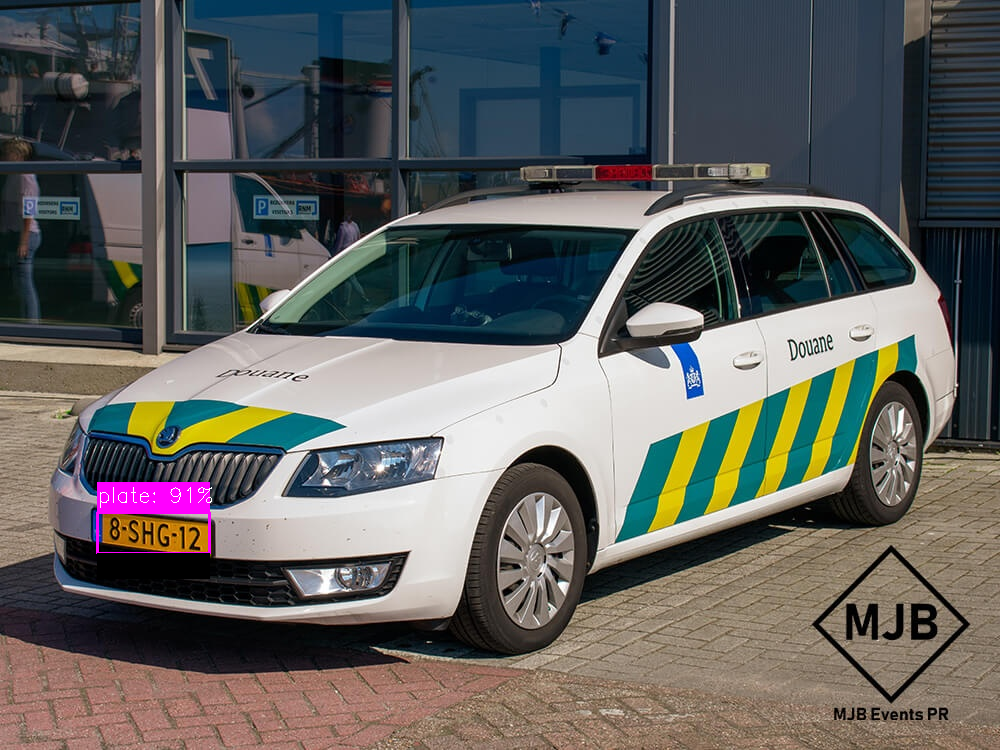

In [20]:
fig = px.imshow(img)
fig.update_layout(width=700, height=400, margin=dict(l=10, r=10, b=10, t=10))
fig.update_xaxes(showticklabels=False).update_yaxes(showticklabels=False)
fig.show()

# APPLY OCR

In [12]:
#Crop the number plate from the image

def crop_number_plate(image_path, bbox):
    # Read the image
    image = cv2.imread(image_path)

    # Extract coordinates from the bounding box
    x, y, w, h = bbox

    # Crop the number plate region from the image
    number_plate = image[y:y+h, x:x+w]

    return number_plate


FileNotFoundError: [Errno 2] No such file or directory: 'img'